# Setup

In [ ]:
%pip install geopandas numpy matplotlib pandas rasterio shapely boto3 botocore scikit-learn folium localtileserver leafmap plotly tqdm xarray ipykernel nbformat ipywidgets umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.9/14.9 MB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 666.8/666.8 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.4/21.4 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 66.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.5/287.5 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB

In [ ]:
# Setup (run this first)
!pip install gdown

import os

if not os.path.exists("data"):
    !gdown --folder "https://drive.google.com/drive/folders/1SyFumvM3eMRQShJxVD-U9Ev75bT8PA8t?usp=share_link"

Retrieving folder contents
Retrieving folder 1XwphcB2LyA29cb9VsE7skKe1S2G3G8x4 alphaearth-workshop
Retrieving folder 1ilKhFT0zjuCESk2j9dixLq1_J9M3OY0x aef_segmentation_embeddings
Retrieving folder 1qIAEF8K8TTvRaG6a37QyjYZAk6ov7tgJ consolidated_tiles
Processing file 11odEVkxhGuWK3lnsk6uKxOwhRKZiUTeg aef_2022_48PUB_3_0_1262780ares.tif
Processing file 1_Mx2kqownRXPFwU6hPgrvOyvVUmFdcSi aef_2022_48PUB_3_0_1262780ares.tif.aux.xml
Processing file 1O70xEVkfDSBeYnbbXLmj23-tKQ35vsE4 aef_2022_48PVC_3_0_1287913ares.tif
Processing file 1tSv4GrJrD9xAiTySvfTihe6E88z_AqTd aef_2022_48PVC_3_0_1287913ares.tif.aux.xml
Processing file 1xKdeTfWcgmJi0SnmJibAm_D2V8YmuihS aef_2022_48QUD_2_4_1250519ares.tif
Processing file 1PKRzlxNWpIk8ujTm0sdl5YmGp5IRc5n_ aef_2022_48QUD_2_4_1250519ares.tif.aux.xml
Retrieving folder 17n_-ZMDDmpp7GRUUA2rlBQoSzQDlry7E annotations
Retrieving folder 1yPm72VhY2N09F7OWIq2ynmLLlToZDQwp alphaearth
Processing file 1rpWKcv_ctKRHbWtzc3Mh1eOmowLTgEiZ workshop_annotations_original.geojson
P

# Core Library
_Run all cells in this section before proceeding. Collapse the section header to hide implementation details._

### Imports, constants & data structures

In [ ]:
import copy
import json
import pickle
from dataclasses import dataclass
from pathlib import Path
from typing import Iterable, Optional, Union

import folium
import geopandas as gpd
import leafmap.foliumap as leafmap
import numpy as np
import plotly.graph_objects as go
import rasterio
from rasterio.enums import Resampling
from rasterio.errors import WindowError
from rasterio.features import geometry_mask
from rasterio.warp import transform_bounds
from rasterio.windows import Window, from_bounds
from shapely.geometry import box, mapping
from shapely.ops import unary_union
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
POSITIVE_CLASS_NAME = "forest"
POWER = 2.0
SCALE = 127.5
MIN_VAL = -127
MAX_VAL = 127
OFFSET = 127


@dataclass(frozen=True)
class TileSplit:
    train_tiles: tuple[str, str]
    test_tile: str


@dataclass(frozen=True)
class ThreeWayTileSplit:
    train_tile: str
    val_tile: str
    test_tile: str

### Embedding dequantization

In [ ]:
def set_nan_on_zero_groups(emb: np.ndarray, group_size: int = 64, inplace: bool = True) -> np.ndarray:
    if emb.shape[0] % group_size != 0:
        raise ValueError(f"Expected first dimension to be divisible by {group_size}, got {emb.shape[0]}.")
    out = emb if inplace else emb.copy()
    grouped = out.reshape(out.shape[0] // group_size, group_size, -1)
    zero_groups = np.all(grouped == 0, axis=1)
    grouped[:] = np.where(zero_groups[:, None, :], np.nan, grouped)
    return out


def dequantize_embeddings(emb: np.ndarray, out: np.ndarray | None = None) -> np.ndarray:
    if out is None:
        out = np.empty_like(emb, dtype=np.float32)
    else:
        if out.shape != emb.shape or out.dtype != np.float32:
            raise ValueError("`out` must match shape and be float32")

    out[...] = emb
    set_nan_on_zero_groups(out, group_size=64, inplace=True)
    np.subtract(out, OFFSET, out=out)
    np.divide(out, SCALE, out=out)
    neg = out < 0
    np.abs(out, out=out)
    if POWER == 2.0:
        np.multiply(out, out, out=out)
    else:
        np.power(out, POWER, out=out)
    np.negative(out, out=out, where=neg)
    return out

### Map visualisation helpers

In [ ]:
_CLASS_PALETTE = [
    "#e6194b", "#3cb44b", "#ffe119", "#4363d8", "#f58231",
    "#911eb4", "#42d4f4", "#f032e6", "#bfef45", "#469990",
    "#dcbeff", "#9a6324", "#800000", "#aaffc3", "#808000",
]


def _build_class_color_map(classes: list[str]) -> dict[str, str]:
    """Assign a stable color from the palette to each class name (sorted order)."""
    return {cls: _CLASS_PALETTE[i % len(_CLASS_PALETTE)] for i, cls in enumerate(classes)}


def raster_to_overlay_image(tif_path: str | Path, max_size: int = 768):
    tif_path = Path(tif_path)
    with rasterio.open(tif_path) as src:
        scale = min(1.0, max_size / max(src.width, src.height))
        out_height = max(1, int(round(src.height * scale)))
        out_width = max(1, int(round(src.width * scale)))
        if src.count == 4:
            data = src.read(out_shape=(src.count, out_height, out_width), resampling=Resampling.nearest)
            image = np.moveaxis(data, 0, -1)
        elif src.count == 64:
            data = dequantize_embeddings(
                src.read(out_shape=(src.count, out_height, out_width), resampling=Resampling.bilinear)
            )
            flat = data.reshape(data.shape[0], -1).T
            valid_mask = np.isfinite(flat).all(axis=1)
            rgb = np.zeros((flat.shape[0], 3), dtype=np.uint8)
            if valid_mask.any():
                projected = PCA(n_components=3, random_state=42).fit_transform(flat[valid_mask])
                projected_min = projected.min(axis=0, keepdims=True)
                projected_max = projected.max(axis=0, keepdims=True)
                scaled = (projected - projected_min) / np.maximum(projected_max - projected_min, 1e-8)
                rgb[valid_mask] = np.clip(np.round(255.0 * scaled), 0, 255).astype(np.uint8)
            image = rgb.reshape(out_height, out_width, 3)
        else:
            data = src.read(1, out_shape=(out_height, out_width), resampling=Resampling.bilinear).astype(np.float32)
            valid_mask = np.isfinite(data)
            image = np.zeros((out_height, out_width, 3), dtype=np.uint8)
            if valid_mask.any():
                valid = data[valid_mask]
                vmin = float(valid.min())
                vmax = float(valid.max())
                scaled = (data - vmin) / max(vmax - vmin, 1e-8)
                gray = np.clip(np.round(255.0 * scaled), 0, 255).astype(np.uint8)
                image[..., 0] = gray
                image[..., 1] = gray
                image[..., 2] = gray
        bounds_4326 = transform_bounds(src.crs, "EPSG:4326", *src.bounds)
    return image, [[bounds_4326[1], bounds_4326[0]], [bounds_4326[3], bounds_4326[2]]]


def add_geotiff_overlay(map_object, tif_path: str | Path, layer_name: str, opacity: float = 1.0, fit_bounds: bool = False, max_size: int = 768):
    image, bounds = raster_to_overlay_image(tif_path, max_size=max_size)
    folium.raster_layers.ImageOverlay(image=image, bounds=bounds, name=layer_name, opacity=opacity, interactive=True).add_to(map_object)
    if fit_bounds:
        map_object.fit_bounds(bounds)


def make_geospatial_map(
    tiff_paths: Optional[Iterable[Union[str, Path]]] = None,
    geojson_paths: Optional[Iterable[Union[str, Path]]] = None,
    basemap: str = "satellite",
    mapbox_token: Optional[str] = None,
    mapbox_style: str = "light-v11",
    geojson_class_field: str = "class",
    raster_opacity: float = 0.75,
    center: Optional[tuple[float, float]] = None,
    zoom: int = 10,
):
    tiff_paths = [Path(p) for p in (tiff_paths or [])]
    geojson_paths = [Path(p) for p in (geojson_paths or [])]
    if center is None:
        center = (20, 0)
    m = leafmap.Map(center=center, zoom=zoom)
    basemap = basemap.lower()
    if basemap == "satellite":
        m.add_basemap("SATELLITE")
    elif basemap == "osm":
        m.add_basemap("OpenStreetMap")
    elif basemap == "mapbox":
        if not mapbox_token:
            raise ValueError("For basemap='mapbox', provide mapbox_token.")
        mapbox_url = (
            f"https://api.mapbox.com/styles/v1/mapbox/{mapbox_style}/tiles/{{z}}/{{x}}/{{y}}"
            f"?access_token={mapbox_token}"
        )
        m.add_tile_layer(url=mapbox_url, name=f"Mapbox {mapbox_style}", attribution="Mapbox")
    else:
        raise ValueError("basemap must be one of {'satellite', 'osm', 'mapbox'}")
    # Build union of all tiff footprints in EPSG:4326 for spatial filtering
    tiff_union = None
    if tiff_paths:
        tiff_boxes = []
        for tif in tiff_paths:
            if not tif.exists():
                raise FileNotFoundError(f"GeoTIFF not found: {tif}")
            with rasterio.open(tif) as src:
                bounds_4326 = transform_bounds(src.crs, "EPSG:4326", *src.bounds)
            tiff_boxes.append(box(*bounds_4326))
        tiff_union = unary_union(tiff_boxes)
    all_bounds = []
    for tif in tiff_paths:
        add_geotiff_overlay(m, tif, layer_name=tif.stem, opacity=raster_opacity, fit_bounds=False)
    for gj in geojson_paths:
        if not gj.exists():
            raise FileNotFoundError(f"GeoJSON not found: {gj}")
        gdf = gpd.read_file(gj)
        if gdf.crs is None:
            raise ValueError(f"GeoJSON has no CRS defined: {gj}")
        gdf = gdf.to_crs(epsg=4326)
        if geojson_class_field not in gdf.columns:
            raise ValueError(
                f"Column '{geojson_class_field}' not found in {gj.name}. Available columns: {list(gdf.columns)}"
            )
        if tiff_union is not None:
            gdf = gdf[gdf.intersects(tiff_union)]
        if gdf.empty:
            continue
        unique_classes = sorted(gdf[geojson_class_field].dropna().unique().tolist())
        class_colors = _build_class_color_map(unique_classes)
        def _style_fn(feature, _colors=class_colors, _field=geojson_class_field):
            color = _colors.get(feature["properties"].get(_field, ""), "#3388ff")
            return {"fillColor": color, "color": color, "fillOpacity": 0.5, "weight": 2}
        minx, miny, maxx, maxy = gdf.total_bounds
        all_bounds.append([[miny, minx], [maxy, maxx]])
        m.add_gdf(gdf, layer_name=gj.stem, info_mode="on_hover", zoom_to_layer=False, style_function=_style_fn)
    if all_bounds:
        min_lat = min(b[0][0] for b in all_bounds)
        min_lon = min(b[0][1] for b in all_bounds)
        max_lat = max(b[1][0] for b in all_bounds)
        max_lon = max(b[1][1] for b in all_bounds)
        m.fit_bounds([[min_lat, min_lon], [max_lat, max_lon]])
    return m

### Embedding visualisation

In [ ]:
def plot_embedding_channels(
    tif_path: str | Path,
    initial_r: int = 0,
    initial_g: int = 21,
    initial_b: int = 42,
) -> None:
    """
    Interactive matplotlib viewer for a 64-band AEF embedding tile.

    Renders the tile as an RGB false-colour composite or single-channel
    grayscale image, with a colour-range legend below the image showing
    the actual dequantized value range for each displayed dimension.
    Use the sliders to choose dimensions manually, the random buttons to
    jump to a random selection, and the toggle to switch modes.
    """
    import ipywidgets as widgets
    import matplotlib.colors as mcolors
    from IPython.display import display as ipython_display

    with rasterio.open(Path(tif_path)) as src:
        raw = src.read()               # (64, H, W)  quantised uint8
    data = dequantize_embeddings(raw)  # (64, H, W)  float32

    def _norm(ch: np.ndarray) -> np.ndarray:
        """Normalise a 2-D float32 channel to [0, 1], mapping NaN to 0."""
        finite = ch[np.isfinite(ch)]
        if finite.size == 0:
            return np.zeros_like(ch)
        vmin, vmax = float(finite.min()), float(finite.max())
        return np.where(
            np.isfinite(ch),
            np.clip((ch - vmin) / max(vmax - vmin, 1e-8), 0.0, 1.0),
            0.0,
        ).astype(np.float32)

    def _make_rgb(r: int, g: int, b: int) -> np.ndarray:
        return np.stack([_norm(data[r]), _norm(data[g]), _norm(data[b])], axis=-1)

    def _make_gray(ch: int) -> np.ndarray:
        return _norm(data[ch])

    def _value_range(dim: int) -> tuple[float, float]:
        """Return the (min, max) of valid dequantized values for one dimension."""
        finite = data[dim][np.isfinite(data[dim])]
        if finite.size == 0:
            return 0.0, 1.0
        return float(finite.min()), float(finite.max())

    def _add_colorbar(ax, cmap_name: str, vmin: float, vmax: float, label: str) -> None:
        sm = plt.cm.ScalarMappable(
            cmap=cmap_name,
            norm=mcolors.Normalize(vmin=vmin, vmax=vmax),
        )
        sm.set_array([])
        cb = plt.colorbar(sm, cax=ax, orientation="horizontal")
        cb.set_label(label, fontsize=9)
        cb.ax.tick_params(labelsize=7)

    # ── shared mode state ─────────────────────────────────────────────────────
    mode = {"value": "rgb"}

    # ── widgets ───────────────────────────────────────────────────────────────
    slider_kw = dict(
        min=0, max=63, step=1, continuous_update=False,
        style={"description_width": "60px"},
        layout=widgets.Layout(width="300px"),
    )

    # RGB controls
    r_slider = widgets.IntSlider(value=initial_r, description="R dim:", **slider_kw)
    g_slider = widgets.IntSlider(value=initial_g, description="G dim:", **slider_kw)
    b_slider = widgets.IntSlider(value=initial_b, description="B dim:", **slider_kw)
    rgb_random_btn = widgets.Button(
        description="Random channels",
        button_style="info",
        layout=widgets.Layout(width="160px"),
    )
    rgb_controls = widgets.HBox([r_slider, g_slider, b_slider, rgb_random_btn])

    # Grayscale controls (hidden initially)
    gray_slider = widgets.IntSlider(value=0, description="dim:", **slider_kw)
    gray_random_btn = widgets.Button(
        description="Random channel",
        button_style="info",
        layout=widgets.Layout(width="160px"),
    )
    gray_controls = widgets.HBox([gray_slider, gray_random_btn])
    gray_controls.layout.display = "none"

    # Mode toggle
    toggle_btn = widgets.ToggleButton(
        value=False,
        description="Switch to Grayscale",
        button_style="warning",
        layout=widgets.Layout(width="185px"),
    )

    out = widgets.Output()

    # ── draw ──────────────────────────────────────────────────────────────────
    def _draw() -> None:
        with out:
            out.clear_output(wait=True)

            if mode["value"] == "rgb":
                r, g, b = r_slider.value, g_slider.value, b_slider.value
                r_min, r_max = _value_range(r)
                g_min, g_max = _value_range(g)
                b_min, b_max = _value_range(b)

                fig = plt.figure(figsize=(7, 8.5))
                gs = fig.add_gridspec(
                    2, 3, height_ratios=[8, 0.45], hspace=0.3, wspace=0.55
                )
                ax_img = fig.add_subplot(gs[0, :])
                ax_img.imshow(_make_rgb(r, g, b))
                ax_img.axis("off")
                ax_img.set_title(
                    f"AlphaEarth embeddings  —  RGB: dim {r} / {g} / {b}",
                    fontsize=12,
                )
                _add_colorbar(fig.add_subplot(gs[1, 0]), "Reds",   r_min, r_max, f"R — dim {r}")
                _add_colorbar(fig.add_subplot(gs[1, 1]), "Greens", g_min, g_max, f"G — dim {g}")
                _add_colorbar(fig.add_subplot(gs[1, 2]), "Blues",  b_min, b_max, f"B — dim {b}")

            else:
                ch = gray_slider.value
                vmin, vmax = _value_range(ch)

                fig = plt.figure(figsize=(7, 8.5))
                gs = fig.add_gridspec(2, 1, height_ratios=[8, 0.45], hspace=0.3)
                ax_img = fig.add_subplot(gs[0])
                ax_img.imshow(_make_gray(ch), cmap="gray")
                ax_img.axis("off")
                ax_img.set_title(
                    f"AlphaEarth embeddings  —  Grayscale: dim {ch}",
                    fontsize=12,
                )
                _add_colorbar(fig.add_subplot(gs[1]), "gray", vmin, vmax, f"dim {ch} value range")

            plt.show()

    # ── callbacks ─────────────────────────────────────────────────────────────
    def _on_rgb_change(_) -> None:
        if mode["value"] == "rgb":
            _draw()

    def _on_gray_change(_) -> None:
        if mode["value"] == "gray":
            _draw()

    def _on_rgb_random(_) -> None:
        for s in (r_slider, g_slider, b_slider):
            s.unobserve(_on_rgb_change, names="value")
        dims = np.random.choice(64, 3, replace=False)
        r_slider.value, g_slider.value, b_slider.value = int(dims[0]), int(dims[1]), int(dims[2])
        for s in (r_slider, g_slider, b_slider):
            s.observe(_on_rgb_change, names="value")
        _draw()

    def _on_gray_random(_) -> None:
        gray_slider.unobserve(_on_gray_change, names="value")
        gray_slider.value = int(np.random.randint(0, 64))
        gray_slider.observe(_on_gray_change, names="value")
        _draw()

    def _on_toggle(change) -> None:
        if change["new"]:
            mode["value"] = "gray"
            toggle_btn.description = "Switch to RGB"
            toggle_btn.button_style = "success"
            rgb_controls.layout.display = "none"
            gray_controls.layout.display = "flex"
        else:
            mode["value"] = "rgb"
            toggle_btn.description = "Switch to Grayscale"
            toggle_btn.button_style = "warning"
            rgb_controls.layout.display = "flex"
            gray_controls.layout.display = "none"
        _draw()

    for s in (r_slider, g_slider, b_slider):
        s.observe(_on_rgb_change, names="value")
    gray_slider.observe(_on_gray_change, names="value")
    rgb_random_btn.on_click(_on_rgb_random)
    gray_random_btn.on_click(_on_gray_random)
    toggle_btn.observe(_on_toggle, names="value")

    _draw()

    ipython_display(widgets.VBox([
        toggle_btn,
        rgb_controls,
        gray_controls,
        out,
    ]))

### Annotation & tile management

In [ ]:
def load_annotations(geojson_path: str | Path) -> gpd.GeoDataFrame:
    gdf = gpd.read_file(geojson_path)
    if "tiff_file" not in gdf.columns or "class" not in gdf.columns:
        raise ValueError("GeoJSON must contain 'tiff_file' and 'class' columns.")
    if gdf.empty:
        raise ValueError("GeoJSON does not contain any features.")
    return gdf


def resolve_tile_path(geojson_path: str | Path, tiff_file_value: str) -> Path:
    geojson_path = Path(geojson_path).resolve()
    return (geojson_path.parent / tiff_file_value).resolve()


def build_tile_index(gdf: gpd.GeoDataFrame, geojson_path: str | Path) -> dict[str, Path]:
    tile_index = {}
    for tiff_file_value in sorted(set(gdf["tiff_file"])):
        tile_path = resolve_tile_path(geojson_path, tiff_file_value)
        tile_index[tile_path.name] = tile_path
    unique_names = sorted(tile_index)
    if len(unique_names) != 3:
        raise AssertionError(f"Expected exactly 3 unique TIFF files, found {len(unique_names)}: {unique_names}")
    return tile_index


def choose_tile_split(available_tiles, train_tiles=None, test_tile=None, seed: int = 42) -> TileSplit:
    available_tiles = sorted(set(available_tiles))
    if len(available_tiles) != 3:
        raise AssertionError(f"Expected exactly 3 available tiles, found {len(available_tiles)}.")
    if train_tiles is None and test_tile is None:
        rng = np.random.default_rng(seed)
        shuffled = list(rng.permutation(available_tiles))
        return TileSplit(train_tiles=tuple(sorted(shuffled[:2])), test_tile=shuffled[2])
    if train_tiles is None or test_tile is None:
        raise ValueError("Provide both train_tiles and test_tile, or provide neither for a random split.")
    train_tiles = tuple(train_tiles)
    if len(train_tiles) != 2:
        raise ValueError("Exactly 2 training tiles must be provided.")
    if len(set(train_tiles)) != 2:
        raise ValueError("Training tiles must be distinct.")
    if test_tile in train_tiles:
        raise ValueError("Test tile must be different from the training tiles.")
    requested = sorted([*train_tiles, test_tile])
    if requested != available_tiles:
        raise ValueError(
            f"Provided split does not match available TIFF names. Available: {available_tiles}; got: {requested}"
        )
    return TileSplit(train_tiles=tuple(sorted(train_tiles)), test_tile=test_tile)


def choose_three_way_tile_split(available_tiles, train_tile=None, val_tile=None, test_tile=None, seed: int = 42):
    available_tiles = sorted(set(available_tiles))
    if len(available_tiles) != 3:
        raise AssertionError(f"Expected exactly 3 available tiles, found {len(available_tiles)}.")
    if train_tile is None and val_tile is None and test_tile is None:
        rng = np.random.default_rng(seed)
        shuffled = list(rng.permutation(available_tiles))
        return ThreeWayTileSplit(train_tile=shuffled[0], val_tile=shuffled[1], test_tile=shuffled[2])
    if not all([train_tile, val_tile, test_tile]):
        raise ValueError("Provide train_tile, val_tile, and test_tile, or provide none.")
    requested = [train_tile, val_tile, test_tile]
    if len(set(requested)) != 3:
        raise ValueError("Train, validation, and test tiles must all be different.")
    if sorted(requested) != available_tiles:
        raise ValueError(
            f"Provided split does not match available TIFF names. Available: {available_tiles}; got: {sorted(requested)}"
        )
    return ThreeWayTileSplit(train_tile=train_tile, val_tile=val_tile, test_tile=test_tile)

### Feature extraction

In [ ]:
def class_to_binary(class_name: str) -> int:
    return int(class_name == POSITIVE_CLASS_NAME)


def extract_pixels_for_tile(gdf: gpd.GeoDataFrame, geojson_path: str | Path, tile_name: str):
    tile_rows = gdf[gdf["tiff_file"].map(lambda value: Path(value).name == tile_name)].copy()
    if tile_rows.empty:
        raise ValueError(f"No annotations found for tile '{tile_name}'.")
    tile_path = build_tile_index(gdf, geojson_path)[tile_name]
    if not tile_path.exists():
        raise FileNotFoundError(f"Raster tile not found: {tile_path}")
    features_list, labels_list, source_class_list = [], [], []
    with rasterio.open(tile_path) as src:
        tile_rows = tile_rows.to_crs(src.crs) if tile_rows.crs and tile_rows.crs != src.crs else tile_rows
        full_window = Window(col_off=0, row_off=0, width=src.width, height=src.height)
        for _, row in tile_rows.iterrows():
            geom = row.geometry
            if geom is None or geom.is_empty:
                continue
            minx, miny, maxx, maxy = geom.bounds
            raw_window = from_bounds(minx, miny, maxx, maxy, src.transform)
            try:
                window = raw_window.round_offsets().round_lengths().intersection(full_window)
            except WindowError:
                continue
            if window.width <= 0 or window.height <= 0:
                continue
            band_cube = dequantize_embeddings(src.read(window=window))
            window_transform = src.window_transform(window)
            mask = geometry_mask([mapping(geom)], transform=window_transform, invert=True, out_shape=(int(window.height), int(window.width)))
            if not mask.any():
                continue
            pixels = band_cube[:, mask].T
            valid_mask = np.isfinite(pixels).all(axis=1)
            pixels = pixels[valid_mask]
            if pixels.size == 0:
                continue
            features_list.append(pixels)
            source_class_name = row["class"]
            labels_list.append(np.full(pixels.shape[0], class_to_binary(source_class_name), dtype=np.int32))
            source_class_list.append(np.full(pixels.shape[0], source_class_name, dtype=object))
    if not features_list:
        raise ValueError(f"No raster pixels were extracted for tile '{tile_name}'.")
    return np.vstack(features_list), np.concatenate(labels_list), np.concatenate(source_class_list)


def build_dataset_for_tiles(geojson_path: str | Path, tile_names):
    gdf = load_annotations(geojson_path)
    features_list, labels_list, classes_list, tiles_list = [], [], [], []
    for tile_name in tile_names:
        features, labels, source_classes = extract_pixels_for_tile(gdf, geojson_path, tile_name)
        features_list.append(features)
        labels_list.append(labels)
        classes_list.append(source_classes)
        tiles_list.append(np.full(features.shape[0], tile_name, dtype=object))
    return np.vstack(features_list), np.concatenate(labels_list), np.concatenate(classes_list), np.concatenate(tiles_list)

### Dimensionality reduction

In [ ]:
def plot_low_dimensional_analysis(
    geojson_path: str | Path,
    tile_names: str | Iterable[str],
    max_samples_per_class: int | None = 2000,
    n_neighbors: int = 15,
    min_dist: float = 0.1,
    random_state: int = 42,
) -> None:
    """
    Reduce per-pixel AEF embeddings from annotated polygons to 2D using
    PCA and UMAP, then plot both projections side-by-side.

    Points are coloured by annotation class so that class separability
    in the 64-dimensional embedding space becomes immediately visible.

    Parameters
    ----------
    geojson_path         : path to the workshop_annotations.geojson file
    tile_names           : one tile name (str) or a list of tile names
    max_samples_per_class: cap per class before fitting (None = no cap)
    n_neighbors          : UMAP neighbourhood size
    min_dist             : UMAP minimum distance between embedded points
    random_state         : seed for reproducibility
    """
    try:
        from umap import UMAP
    except ImportError:
        raise ImportError("umap-learn is required — run: pip install umap-learn")

    if isinstance(tile_names, str):
        tile_names = [tile_names]
    tile_names = list(tile_names)

    # ── extract per-pixel embeddings for all requested tiles ──────────────────
    features, _, source_classes, _ = build_dataset_for_tiles(geojson_path, tile_names)

    # ── per-class subsampling to keep UMAP fast ───────────────────────────────
    if max_samples_per_class is not None:
        rng = np.random.default_rng(random_state)
        keep = []
        for cls in np.unique(source_classes):
            idx = np.where(source_classes == cls)[0]
            if len(idx) > max_samples_per_class:
                idx = rng.choice(idx, max_samples_per_class, replace=False)
            keep.append(idx)
        keep = np.sort(np.concatenate(keep))
        features = features[keep]
        source_classes = source_classes[keep]

    print(f"Projecting {features.shape[0]:,} pixels × {features.shape[1]} dims → 2D …")

    # ── standardise before fitting ────────────────────────────────────────────
    features_scaled = StandardScaler().fit_transform(features)

    # ── PCA → 2D ──────────────────────────────────────────────────────────────
    pca_2d = PCA(n_components=2, random_state=random_state).fit_transform(features_scaled)

    # ── UMAP → 2D ─────────────────────────────────────────────────────────────
    umap_2d = UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        random_state=random_state,
    ).fit_transform(features_scaled)

    # ── colour map (shared with map visualisations) ───────────────────────────
    unique_classes = sorted(np.unique(source_classes).tolist())
    class_colors = _build_class_color_map(unique_classes)

    # ── plot ──────────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    for ax, coords, method in [(axes[0], pca_2d, "PCA"), (axes[1], umap_2d, "UMAP")]:
        for cls in unique_classes:
            mask = source_classes == cls
            ax.scatter(
                coords[mask, 0], coords[mask, 1],
                c=class_colors[cls],
                s=4,
                alpha=0.6,
                linewidths=0,
                label=cls,
            )
        ax.set_title(method, fontsize=13, fontweight="bold")
        ax.set_xlabel(f"{method} dim 1")
        ax.set_ylabel(f"{method} dim 2")
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
        ax.set_aspect("equal", adjustable="datalim")

    # shared legend outside the plots
    handles, legend_labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, legend_labels,
        title="Class",
        loc="center right",
        markerscale=4,
        frameon=True,
        bbox_to_anchor=(1.02, 0.5),
    )

    tile_label = (", ".join(tile_names) if len(tile_names) <= 2
                  else f"{len(tile_names)} tiles")
    fig.suptitle(
        f"AEF embeddings — low-dimensional view   [{tile_label}]",
        fontsize=13,
    )
    plt.tight_layout()
    plt.show()

### Persistence & evaluation utilities

In [ ]:
def save_model_artifact(model_path: str | Path, artifact: dict) -> Path:
    model_path = Path(model_path)
    model_path.parent.mkdir(parents=True, exist_ok=True)
    with model_path.open("wb") as handle:
        pickle.dump(artifact, handle)
    return model_path


def load_model_artifact(model_path: str | Path) -> dict:
    with Path(model_path).open("rb") as handle:
        return pickle.load(handle)


def save_json(output_path: str | Path, payload: dict) -> Path:
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)
    output_path.write_text(json.dumps(payload, indent=2, sort_keys=True))
    return output_path


def compute_binary_metrics(y_true: np.ndarray, y_pred: np.ndarray, positive_class_name: str = POSITIVE_CLASS_NAME) -> dict:
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true,
        y_pred,
        labels=[1, 0],
        zero_division=0,
    )
    cm = confusion_matrix(y_true, y_pred, labels=[1, 0])
    negative_class_name = f"not_{positive_class_name}"
    return {
        "labels": {"positive": positive_class_name, "negative": negative_class_name},
        "per_class": {
            positive_class_name: {
                "precision": float(precision[0]),
                "recall": float(recall[0]),
                "f1": float(f1[0]),
                "support": int(support[0]),
            },
            negative_class_name: {
                "precision": float(precision[1]),
                "recall": float(recall[1]),
                "f1": float(f1[1]),
                "support": int(support[1]),
            },
        },
        "confusion_matrix": {"label_order": [positive_class_name, negative_class_name], "matrix": cm.tolist()},
    }


def write_forest_overlay_geotiff(prediction_mask: np.ndarray, reference_profile: dict, output_path: str | Path) -> Path:
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)
    overlay = np.zeros((4, prediction_mask.shape[0], prediction_mask.shape[1]), dtype=np.uint8)
    forest_pixels = prediction_mask == 1
    overlay[1, forest_pixels] = 255
    overlay[3, forest_pixels] = 128
    profile = reference_profile.copy()
    profile.update({"count": 4, "dtype": rasterio.uint8, "nodata": None, "photometric": "RGBA"})
    with rasterio.open(output_path, "w", **profile) as dst:
        dst.write(overlay)
    return output_path


def resolve_test_tile_path(geojson_path: str | Path, test_tile_name: str) -> Path:
    gdf = load_annotations(geojson_path)
    tile_index = build_tile_index(gdf, geojson_path)
    return tile_index[test_tile_name]


def build_prediction_map(geojson_path: str | Path, test_tile_path: str | Path, overlay_path: str | Path, positive_class_name: str = POSITIVE_CLASS_NAME):
    gdf = load_annotations(geojson_path)
    test_tile_name = Path(test_tile_path).name
    test_annotations = gdf[gdf["tiff_file"].map(lambda value: Path(value).name == test_tile_name)].copy()
    if test_annotations.crs is None:
        raise ValueError("Annotations GeoJSON does not define a CRS.")
    test_annotations = test_annotations.to_crs(epsg=4326)
    with rasterio.open(test_tile_path) as src:
        bounds_4326 = transform_bounds(src.crs, "EPSG:4326", *src.bounds)
        center = ((bounds_4326[1] + bounds_4326[3]) / 2, (bounds_4326[0] + bounds_4326[2]) / 2)
    map_object = leafmap.Map(center=center, zoom=12)
    map_object.add_basemap("SATELLITE")
    add_geotiff_overlay(map_object, test_tile_path, layer_name="Input Tile", opacity=0.9, fit_bounds=True)
    add_geotiff_overlay(map_object, overlay_path, layer_name=f"{positive_class_name.title()} Prediction", opacity=1.0, fit_bounds=False)
    unique_classes = sorted(test_annotations["class"].dropna().unique().tolist())
    class_colors = _build_class_color_map(unique_classes)
    def _style_fn(feature, _colors=class_colors):
        color = _colors.get(feature["properties"].get("class", ""), "#3388ff")
        return {"fillColor": color, "color": color, "fillOpacity": 0.5, "weight": 2}
    map_object.add_gdf(test_annotations, layer_name="Test Annotations", info_mode="on_hover", zoom_to_layer=False, style_function=_style_fn)
    return map_object

def print_svm_metrics(metrics: dict) -> None:
    """Display SVM evaluation metrics as styled pandas tables."""
    import pandas as pd
    from IPython.display import display, HTML

    pos = metrics["labels"]["positive"]
    neg = metrics["labels"]["negative"]
    pc  = metrics["per_class"]
    test_tile = metrics.get("test_tile", "?")
    n_samples = metrics.get("n_test_samples", 0)

    display(HTML(
        f"<h4 style='margin-bottom:4px'>SVM — Test Results</h4>"
        f"<p style='margin-top:0'>Test tile: <code>{test_tile}</code>"
        f"&nbsp;|&nbsp; Samples: <b>{n_samples:,}</b></p>"
    ))

    # ── per-class metrics ─────────────────────────────────────────────────────
    df = pd.DataFrame([
        {"Class": pos, "Precision": pc[pos]["precision"], "Recall": pc[pos]["recall"],
         "F1": pc[pos]["f1"], "Support": pc[pos]["support"]},
        {"Class": neg, "Precision": pc[neg]["precision"], "Recall": pc[neg]["recall"],
         "F1": pc[neg]["f1"], "Support": pc[neg]["support"]},
    ]).set_index("Class")

    display(
        df.style
        .format({"Precision": "{:.3f}", "Recall": "{:.3f}", "F1": "{:.3f}", "Support": "{:,}"})
        .background_gradient(subset=["Precision", "Recall", "F1"], cmap="RdYlGn", vmin=0.5, vmax=1.0)
        .set_caption("Per-class metrics")
        .set_table_styles([{"selector": "caption",
                            "props": [("font-weight", "bold"), ("font-size", "13px"),
                                      ("text-align", "left")]}])
    )

    # ── confusion matrix ──────────────────────────────────────────────────────
    cm           = metrics["confusion_matrix"]["matrix"]
    label_order  = metrics["confusion_matrix"]["label_order"]
    cm_df = pd.DataFrame(
        cm,
        index=[f"True: {l}" for l in label_order],
        columns=[f"Pred: {l}" for l in label_order],
    )
    display(
        cm_df.style
        .format("{:,}")
        .background_gradient(cmap="Blues")
        .set_caption("Confusion matrix")
        .set_table_styles([{"selector": "caption",
                            "props": [("font-weight", "bold"), ("font-size", "13px"),
                                      ("text-align", "left")]}])
    )


def print_mlp_metrics(metrics: dict) -> None:
    """Display MLP evaluation metrics as styled pandas tables."""
    import pandas as pd
    from IPython.display import display, HTML

    best_epoch = metrics.get("best_epoch", "?")
    best_f1    = metrics.get("best_val_forest_f1", 0.0)
    hidden     = metrics.get("hidden_layer_sizes", [])
    arch       = " → ".join(str(x) for x in hidden)

    display(HTML(
        f"<h4 style='margin-bottom:4px'>MLP — Evaluation Results</h4>"
        f"<p style='margin-top:0'>Architecture: <code>64 → {arch} → 2</code>"
        f"&nbsp;|&nbsp; Best epoch: <b>{best_epoch}</b>"
        f"&nbsp;|&nbsp; Best val forest F1: <b>{best_f1:.3f}</b></p>"
    ))

    pos = metrics["train"]["labels"]["positive"]
    neg = metrics["train"]["labels"]["negative"]

    # ── per-class metrics across all splits ───────────────────────────────────
    rows = []
    for split in ("train", "val", "test"):
        pc = metrics[split]["per_class"]
        for cls in (pos, neg):
            rows.append({
                "Split": split, "Class": cls,
                "Precision": pc[cls]["precision"],
                "Recall":    pc[cls]["recall"],
                "F1":        pc[cls]["f1"],
                "Support":   pc[cls]["support"],
            })

    df = pd.DataFrame(rows).set_index(["Split", "Class"])

    display(
        df.style
        .format({"Precision": "{:.3f}", "Recall": "{:.3f}", "F1": "{:.3f}", "Support": "{:,}"})
        .background_gradient(subset=["Precision", "Recall", "F1"], cmap="RdYlGn", vmin=0.5, vmax=1.0)
        .set_caption("Per-class metrics — train / val / test")
        .set_table_styles([{"selector": "caption",
                            "props": [("font-weight", "bold"), ("font-size", "13px"),
                                      ("text-align", "left")]}])
    )

    # ── confusion matrix for the held-out test split ──────────────────────────
    cm          = metrics["test"]["confusion_matrix"]["matrix"]
    label_order = metrics["test"]["confusion_matrix"]["label_order"]
    cm_df = pd.DataFrame(
        cm,
        index=[f"True: {l}" for l in label_order],
        columns=[f"Pred: {l}" for l in label_order],
    )
    display(
        cm_df.style
        .format("{:,}")
        .background_gradient(cmap="Blues")
        .set_caption("Confusion matrix (test split)")
        .set_table_styles([{"selector": "caption",
                            "props": [("font-weight", "bold"), ("font-size", "13px"),
                                      ("text-align", "left")]}])
    )

### SVM pipeline

In [ ]:
def make_svm_pipeline(c_value: float = 1.0, random_state: int = 42) -> Pipeline:
    return Pipeline(steps=[("scaler", StandardScaler()), ("svm", LinearSVC(C=c_value, dual=False, max_iter=10000, random_state=random_state))])


def train_svm_model(geojson_path: str | Path, train_tiles, c_value: float = 1.0, random_state: int = 42):
    train_tiles = tuple(train_tiles)
    features, labels, source_classes, tile_names = build_dataset_for_tiles(geojson_path, train_tiles)
    model = make_svm_pipeline(c_value=c_value, random_state=random_state)
    model.fit(features, labels)
    metadata = {
        "geojson_path": str(Path(geojson_path).resolve()),
        "train_tiles": list(train_tiles),
        "n_train_samples": int(features.shape[0]),
        "n_features": int(features.shape[1]),
        "positive_class_name": POSITIVE_CLASS_NAME,
        "source_classes": sorted(set(source_classes.tolist())),
        "tile_sample_counts": {tile_name: int(np.sum(tile_names == tile_name)) for tile_name in sorted(set(tile_names.tolist()))},
    }
    return model, metadata


def train_and_save_model(geojson_path: str, model_out: str = "artifacts/svm_model.pkl", train_tiles=None, test_tile=None, seed: int = 42, c_value: float = 1.0) -> dict:
    gdf = load_annotations(geojson_path)
    tile_names = sorted(build_tile_index(gdf, geojson_path))
    split = choose_tile_split(tile_names, train_tiles=train_tiles, test_tile=test_tile, seed=seed)
    model, metadata = train_svm_model(geojson_path=geojson_path, train_tiles=split.train_tiles, c_value=c_value, random_state=seed)
    metadata["test_tile"] = split.test_tile
    metadata["all_tiles"] = tile_names
    artifact = {"model": model, "metadata": metadata}
    model_path = save_model_artifact(model_out, artifact)
    artifact["model_path"] = str(model_path.resolve())
    return artifact


def evaluate_svm_model(model_path: str, geojson_path: str | None = None) -> dict:
    artifact = load_model_artifact(model_path)
    model = artifact["model"]
    metadata = artifact["metadata"]
    resolved_geojson_path = geojson_path or metadata["geojson_path"]
    test_tile = metadata["test_tile"]
    features, labels, source_classes, tile_names = build_dataset_for_tiles(resolved_geojson_path, [test_tile])
    predictions = model.predict(features)
    metrics = compute_binary_metrics(labels, predictions, positive_class_name=metadata["positive_class_name"])
    metrics.update({
        "test_tile": test_tile,
        "n_test_samples": int(features.shape[0]),
        "source_classes_in_test_tile": sorted(set(source_classes.tolist())),
        "tile_names_in_test_set": sorted(set(tile_names.tolist())),
    })
    return metrics


OUTCOME_COLORS = {"TP": "#2ca02c", "TN": "#1f77b4", "FP": "#d62728", "FN": "#ff7f0e"}


def compute_outcome_labels(y_true: np.ndarray, y_pred: np.ndarray) -> np.ndarray:
    outcome_labels = np.empty(y_true.shape[0], dtype=object)
    outcome_labels[(y_true == 1) & (y_pred == 1)] = "TP"
    outcome_labels[(y_true == 0) & (y_pred == 0)] = "TN"
    outcome_labels[(y_true == 0) & (y_pred == 1)] = "FP"
    outcome_labels[(y_true == 1) & (y_pred == 0)] = "FN"
    return outcome_labels


def build_svm_visualization_figure(model_path: str, geojson_path: str | None = None) -> go.Figure:
    artifact = load_model_artifact(model_path)
    model = artifact["model"]
    metadata = artifact["metadata"]
    resolved_geojson_path = geojson_path or metadata["geojson_path"]
    test_tile = metadata["test_tile"]
    features, labels, source_classes, tile_names = build_dataset_for_tiles(resolved_geojson_path, [test_tile])
    predictions = model.predict(features)
    outcomes = compute_outcome_labels(labels, predictions)
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    pca = PCA(n_components=3, random_state=42)
    features_pca = pca.fit_transform(features_scaled)
    viz_model = Pipeline(steps=[("scaler", StandardScaler()), ("svm", LinearSVC(C=1.0, dual=False, max_iter=10000, random_state=42))])
    viz_model.fit(features_pca, labels)
    viz_svm = viz_model.named_steps["svm"]
    viz_scaler = viz_model.named_steps["scaler"]
    transformed_for_plane = viz_scaler.transform(features_pca)
    x_range = np.linspace(transformed_for_plane[:, 0].min(), transformed_for_plane[:, 0].max(), 20)
    y_range = np.linspace(transformed_for_plane[:, 1].min(), transformed_for_plane[:, 1].max(), 20)
    xx, yy = np.meshgrid(x_range, y_range)
    coef = viz_svm.coef_[0]
    intercept = viz_svm.intercept_[0]
    if abs(coef[2]) < 1e-8:
        raise ValueError("Visualization plane is numerically unstable because the third PCA axis has near-zero weight.")
    zz = -(coef[0] * xx + coef[1] * yy + intercept) / coef[2]
    pca_space_plane = np.column_stack([xx.ravel(), yy.ravel(), zz.ravel()])
    plane_points = pca_space_plane * viz_scaler.scale_ + viz_scaler.mean_
    plane_x = plane_points[:, 0].reshape(xx.shape)
    plane_y = plane_points[:, 1].reshape(xx.shape)
    plane_z = plane_points[:, 2].reshape(xx.shape)
    unique_classes = sorted(set(source_classes.tolist()))
    class_colors = _build_class_color_map(unique_classes)
    figure = go.Figure()
    for cls in unique_classes:
        mask = source_classes == cls
        if not mask.any():
            continue
        figure.add_trace(go.Scatter3d(
            x=features_pca[mask, 0], y=features_pca[mask, 1], z=features_pca[mask, 2], mode="markers", name=cls,
            marker={"size": 3, "color": class_colors[cls], "opacity": 0.8},
            customdata=np.column_stack([outcomes[mask], tile_names[mask], predictions[mask], labels[mask]]),
            hovertemplate="class=%{fullData.name}<br>outcome=%{customdata[0]}<br>tile=%{customdata[1]}<br>pred=%{customdata[2]}<br>true=%{customdata[3]}<extra></extra>",
        ))
    figure.add_trace(go.Surface(x=plane_x, y=plane_y, z=plane_z, name="Approx. PCA Hyperplane", opacity=0.35, showscale=False, colorscale=[[0.0, "#bbbbbb"], [1.0, "#888888"]]))
    figure.update_layout(title=f"SVM predictions on {test_tile} | points in PCA(3) space | plane fitted only for visualization", scene={"xaxis_title": "PC1", "yaxis_title": "PC2", "zaxis_title": "PC3"}, legend={"itemsizing": "constant"})
    return figure


def predict_svm_full_tile(model_path: str, geojson_path: str | None = None):
    artifact = load_model_artifact(model_path)
    model = artifact["model"]
    metadata = artifact["metadata"]
    resolved_geojson_path = geojson_path or metadata["geojson_path"]
    test_tile_path = resolve_test_tile_path(resolved_geojson_path, metadata["test_tile"])
    with rasterio.open(test_tile_path) as src:
        cube = dequantize_embeddings(src.read())
        height = src.height
        width = src.width
        profile = src.profile.copy()
    flat_features = cube.reshape(cube.shape[0], -1).T
    valid_mask = np.isfinite(flat_features).all(axis=1)
    predictions = np.zeros(flat_features.shape[0], dtype=np.uint8)
    if valid_mask.any():
        predictions[valid_mask] = model.predict(flat_features[valid_mask]).astype(np.uint8)
    return predictions.reshape(height, width), profile, metadata, test_tile_path


def build_svm_prediction_map_outputs(model_path: str, geojson_path: str | None = None, overlay_out: str = "artifacts/svm_test_predictions_overlay.tif", prediction_html_out: str | None = "artifacts/svm_test_predictions_map.html") -> dict:
    prediction_mask, profile, metadata, test_tile_path = predict_svm_full_tile(model_path, geojson_path=geojson_path)
    overlay_path = write_forest_overlay_geotiff(prediction_mask, profile, overlay_out)
    map_object = build_prediction_map(geojson_path=geojson_path or metadata["geojson_path"], test_tile_path=test_tile_path, overlay_path=overlay_path, positive_class_name=metadata["positive_class_name"])
    html_path = None
    if prediction_html_out:
        html_path = Path(prediction_html_out)
        html_path.parent.mkdir(parents=True, exist_ok=True)
        map_object.to_html(str(html_path))
    return {"map": map_object, "overlay_path": str(Path(overlay_path).resolve()), "html_path": str(html_path.resolve()) if html_path else None, "test_tile_path": str(test_tile_path.resolve())}

### MLP pipeline

In [ ]:
def make_mlp_model(hidden_layer_sizes: tuple[int, int, int] = (128, 64, 32), random_state: int = 42, learning_rate_init: float = 1e-3) -> MLPClassifier:
    return MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, activation="relu", solver="adam", alpha=1e-4, batch_size=256, learning_rate_init=learning_rate_init, max_iter=1, warm_start=True, shuffle=True, random_state=random_state)


def train_mlp_model(geojson_path: str | Path, train_tile: str, val_tile: str, hidden_layer_sizes: tuple[int, int, int] = (128, 64, 32), max_epochs: int = 50, patience: int = 5, random_state: int = 42, learning_rate_init: float = 1e-3):
    train_features, train_labels, _, _ = build_dataset_for_tiles(geojson_path, [train_tile])
    val_features, val_labels, _, _ = build_dataset_for_tiles(geojson_path, [val_tile])
    print(f"Starting MLP training | train_tile={train_tile} ({train_features.shape[0]} samples) | val_tile={val_tile} ({val_features.shape[0]} samples)")
    scaler = StandardScaler()
    train_features_scaled = scaler.fit_transform(train_features)
    val_features_scaled = scaler.transform(val_features)
    model = make_mlp_model(hidden_layer_sizes=hidden_layer_sizes, random_state=random_state, learning_rate_init=learning_rate_init)
    best_model = None
    best_f1 = float("-inf")
    best_epoch = 0
    epochs_without_improvement = 0
    history = []
    progress_bar = tqdm(range(1, max_epochs + 1), desc="MLP epochs", unit="epoch")
    for epoch in progress_bar:
        model.partial_fit(train_features_scaled, train_labels, classes=np.array([0, 1], dtype=np.int32))
        train_predictions = model.predict(train_features_scaled)
        val_predictions = model.predict(val_features_scaled)
        train_metrics = compute_binary_metrics(train_labels, train_predictions)
        val_metrics = compute_binary_metrics(val_labels, val_predictions)
        current_val_f1 = val_metrics["per_class"][POSITIVE_CLASS_NAME]["f1"]
        current_val_precision = val_metrics["per_class"][POSITIVE_CLASS_NAME]["precision"]
        current_val_recall = val_metrics["per_class"][POSITIVE_CLASS_NAME]["recall"]
        current_train_f1 = train_metrics["per_class"][POSITIVE_CLASS_NAME]["f1"]
        train_loss = float(model.loss_)
        history.append({"epoch": epoch, "train_loss": train_loss, "train_forest_f1": current_train_f1, "val_forest_f1": current_val_f1})
        if current_val_f1 > best_f1:
            best_f1 = current_val_f1
            best_epoch = epoch
            best_model = copy.deepcopy(model)
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1
        progress_bar.set_postfix(loss=f"{train_loss:.4f}", train_f1=f"{current_train_f1:.4f}", val_p=f"{current_val_precision:.4f}", val_r=f"{current_val_recall:.4f}", val_f1=f"{current_val_f1:.4f}", best_f1=f"{best_f1:.4f}", patience=f"{epochs_without_improvement}/{patience}")
        if epochs_without_improvement >= patience:
            progress_bar.write(f"Early stopping at epoch {epoch}: no validation forest F1 improvement in {patience} epochs.")
            break
    progress_bar.close()
    if best_model is None:
        raise RuntimeError("MLP training did not produce a valid best model.")
    print(f"Best model selected from epoch {best_epoch} with validation forest F1={best_f1:.4f}")
    artifact = {"scaler": scaler, "model": best_model}
    metadata = {
        "geojson_path": str(Path(geojson_path).resolve()),
        "train_tile": train_tile,
        "val_tile": val_tile,
        "positive_class_name": POSITIVE_CLASS_NAME,
        "n_features": int(train_features.shape[1]),
        "n_train_samples": int(train_features.shape[0]),
        "n_val_samples": int(val_features.shape[0]),
        "hidden_layer_sizes": list(hidden_layer_sizes),
        "best_epoch": best_epoch,
        "best_val_forest_f1": best_f1,
        "patience": patience,
        "max_epochs": max_epochs,
        "learning_rate_init": learning_rate_init,
        "history": history,
    }
    return artifact, metadata


def train_and_save_mlp(geojson_path: str, model_out: str = "artifacts/mlp_model.pkl", train_tile: str | None = None, val_tile: str | None = None, test_tile: str | None = None, seed: int = 42, max_epochs: int = 50, patience: int = 5, learning_rate: float = 1e-3, hidden_dims: tuple[int, int, int] = (128, 64, 32)) -> dict:
    gdf = load_annotations(geojson_path)
    tile_names = sorted(build_tile_index(gdf, geojson_path))
    split = choose_three_way_tile_split(tile_names, train_tile=train_tile, val_tile=val_tile, test_tile=test_tile, seed=seed)
    artifact, metadata = train_mlp_model(geojson_path=geojson_path, train_tile=split.train_tile, val_tile=split.val_tile, hidden_layer_sizes=hidden_dims, max_epochs=max_epochs, patience=patience, random_state=seed, learning_rate_init=learning_rate)
    metadata["test_tile"] = split.test_tile
    metadata["all_tiles"] = tile_names
    artifact["metadata"] = metadata
    model_path = save_model_artifact(model_out, artifact)
    artifact["model_path"] = str(model_path.resolve())
    return artifact


def evaluate_mlp_artifact(artifact: dict, geojson_path: str | Path, tile_name: str) -> dict:
    features, labels, source_classes, tile_names = build_dataset_for_tiles(geojson_path, [tile_name])
    scaler = artifact["scaler"]
    model = artifact["model"]
    predictions = model.predict(scaler.transform(features))
    metrics = compute_binary_metrics(labels, predictions)
    metrics.update({"tile_name": tile_name, "n_samples": int(features.shape[0]), "source_classes_in_tile": sorted(set(source_classes.tolist())), "tile_names_in_dataset": sorted(set(tile_names.tolist()))})
    return metrics


def evaluate_mlp_model(model_path: str, geojson_path: str | None = None) -> dict:
    artifact = load_model_artifact(model_path)
    metadata = artifact["metadata"]
    resolved_geojson_path = geojson_path or metadata["geojson_path"]
    train_metrics = evaluate_mlp_artifact(artifact, resolved_geojson_path, metadata["train_tile"])
    train_metrics["split"] = "train"
    val_metrics = evaluate_mlp_artifact(artifact, resolved_geojson_path, metadata["val_tile"])
    val_metrics["split"] = "val"
    test_metrics = evaluate_mlp_artifact(artifact, resolved_geojson_path, metadata["test_tile"])
    test_metrics["split"] = "test"
    return {"train": train_metrics, "val": val_metrics, "test": test_metrics, "best_epoch": metadata["best_epoch"], "best_val_forest_f1": metadata["best_val_forest_f1"], "hidden_layer_sizes": metadata["hidden_layer_sizes"]}


def predict_mlp_full_tile(artifact: dict, tile_path: str | Path):
    tile_path = Path(tile_path)
    scaler = artifact["scaler"]
    model = artifact["model"]
    with rasterio.open(tile_path) as src:
        cube = dequantize_embeddings(src.read())
        height = src.height
        width = src.width
        profile = src.profile.copy()
    flat_features = cube.reshape(cube.shape[0], -1).T
    valid_mask = np.isfinite(flat_features).all(axis=1)
    predictions = np.zeros(flat_features.shape[0], dtype=np.uint8)
    if valid_mask.any():
        scaled = scaler.transform(flat_features[valid_mask])
        predictions[valid_mask] = model.predict(scaled).astype(np.uint8)
    return predictions.reshape(height, width), profile


def build_mlp_visualization_outputs(model_path: str, geojson_path: str | None = None, overlay_out: str = "artifacts/mlp_test_predictions_overlay.tif", html_out: str | None = "artifacts/mlp_test_predictions_map.html") -> dict:
    artifact = load_model_artifact(model_path)
    metadata = artifact["metadata"]
    resolved_geojson_path = geojson_path or metadata["geojson_path"]
    test_tile_path = resolve_test_tile_path(resolved_geojson_path, metadata["test_tile"])
    prediction_mask, reference_profile = predict_mlp_full_tile(artifact, test_tile_path)
    overlay_path = write_forest_overlay_geotiff(prediction_mask, reference_profile, overlay_out)
    map_object = build_prediction_map(geojson_path=resolved_geojson_path, test_tile_path=test_tile_path, overlay_path=overlay_path, positive_class_name=metadata["positive_class_name"])
    html_path = None
    if html_out:
        html_path = Path(html_out)
        html_path.parent.mkdir(parents=True, exist_ok=True)
        map_object.to_html(str(html_path))
    return {"map": map_object, "overlay_path": str(Path(overlay_path).resolve()), "html_path": str(html_path.resolve()) if html_path else None, "test_tile_path": str(test_tile_path.resolve())}

# AlphaEarth Foundations (AEF)

![headline_aef.png](https://drive.google.com/uc?export=view&id=1Pl5R6vMVgX0WbahNAR_Khlg7LvZ6ov7e)

*Source: Brown, C. F., Kazmierski, M. R., ... arXiv:2507.22291.*
https://arxiv.org/pdf/2507.22291

AlphaEarth Foundations (AEF) models Earth system dynamics by encoding multi-source spatiotemporal inputs—$N_i$ frames with $C_i$ channels across modalities $i \in M_E$ and timestamps $t_j$—into a unified representation over a chosen time interval.

Given a valid period $[t_s, t_e)$ with $t_s < t_e$, AEF produces a compact embedding $A(t_s, t_e)$ that summarizes the temporal behavior of the system. Embeddings we'll be working with today has been generated for 2022, i.e  $t_s = 01.01.2022$, $t_e = 31.12.2022$. Note that $t_s$ and $t_e$ are arbitrary inputs to the model, thereby allowing the AEF to operate over arbitrary temporal ranges.


The embedding $A \in \mathbb{R}^{64}$ is a fixed-size (64-dimensions) representation capturing the temporal trajectory of key variables across heterogeneous data sources.

By incorporating an explicit term in the loss function (cf. “Batch Uniformity” in the referenced work), the learned embeddings are encouraged to lie on the unit hypersphere. Consequently, each embedding vector $A$ resides approximately in   $\mathbb{S}^{63}$ (Section E on the image)


# Let's visualize Embeddings

### What do these dimensions mean?


| Exclusive Embedding Dimension | Associated Land Cover Class | Distinctive Trait |
|------------------------------|----------------------------|------------------|
| A09, A35 | Built-up | Urban surfaces and infrastructure (roofs, roads, concrete). Radiometric signature dominated by artificial materials with high SWIR reflectance compared to NIR and strong Sentinel-1 backscatter. Unique combination of angular geometry and artificial-material spectrum. |
| A12, A50 | Cropland | Annual crops with regular phenology (clear greenness peaks), geometric patterns (plots, furrows), and intensive management. Certain homogeneous or irrigated crop signatures are unique to cropland. |
| A05, A27 | Mangroves | Evergreen vegetation in intertidal zones. Dense canopy combined with coastal linear patterns, water between crowns, and specific NIR/SWIR signatures due to waterlogging. Unique mix of forest, water, and coastal context. |
| A04, A11, A25, A29 | Herbaceous wetland | Herbaceous vegetation with permanent or regular flooding. Combines moderate–high NDVI with high water indices and floodplain textures. Unique combination of vegetation and long-term flooding. |
| A18, A21, A26 | Shrubland | Natural shrubs (≥10% cover), often in semi-arid regions. Distinct subtypes with specific height, density, and spatial patterns (e.g., Mediterranean shrublands) forming unique signatures. |
| A16, A23 | Tree cover | Tree-dominated regions (≥10% cover), including plantations. High NIR, strong shadows, closed canopy textures, and persistent phenology distinguish them from shrubs and grasslands. |
| A41 | Grassland | Herbaceous vegetation (≥10% cover) without dominant woody stems. Seasonal but structurally homogeneous, lacking flooding or geometric patterns seen in wetlands or cropland. |
| A44, A57 | Moss/lichen | Moss- and lichen-dominated surfaces in tundra or arid rocky areas. Low structure, moderate NDVI, and fine textures over rock or soil distinguish them from taller vegetation. |
| A63 | Bare/sparse vegetation | Soil, sand, or rock with <10% vegetation year-round. High VIS/SWIR reflectance, minimal chlorophyll signal, and little temporal variation. |
| A64 | Permanent water bodies | Water present ≥9 months/year. Strong absorption in NIR/SWIR, smooth texture, and distinct geometry (rivers, lakes). Unique near-zero reflectance signature. |

*Source: https://arxiv.org/abs/2603.16911*

Usage
- Use the sliders to pick any three of the 64 embedding dimensions as R, G, B channels and see what the tile looks like.  Press **Random channels** to explore random combinations.

- You can also switch to Grayscale mode and do the same with only 1 channel.
- Axy denotes dimension xy. For instance, A35 denotes 35-th dimension

In [ ]:
TILE_PATH = "./data/alphaearth-workshop/aef_segmentation_embeddings/consolidated_tiles/aef_2022_48PUB_3_0_1262780ares.tif"

plot_embedding_channels(TILE_PATH)

# Let's visualize labels

**Note:** The basemap (satellite imagery) is not temporally aligned with the annotations. Consequently, the ground truth labels may not correspond to the visual content of the imagery. The annotations were generated for the year 2022, whereas the displayed basemap reflects the most recent available imagery.



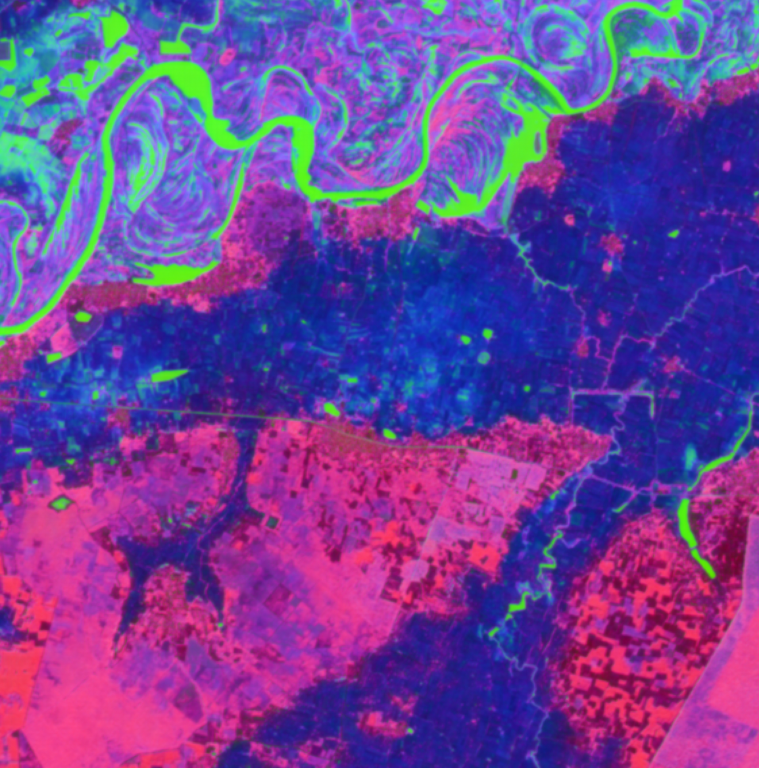

In [ ]:
m = make_geospatial_map(
    tiff_paths=[
        "./data/alphaearth-workshop/aef_segmentation_embeddings/consolidated_tiles/aef_2022_48PUB_3_0_1262780ares.tif",
    ],
    geojson_paths=[
        "./data/alphaearth-workshop/annotations/alphaearth/workshop_annotations_original.geojson",
    ],
    basemap="SATELLITE",
    raster_opacity=0.6,
)
m


# Low Dimensional Analysis

We reduce the 64-dimensional AEF embeddings of every annotated pixel to 2D using **PCA** (linear) and **UMAP** (non-linear) and plot them side-by-side.

If the embeddings are meaningful, pixels from the same land-cover class should cluster together — well before any classifier is trained.

Projecting 10,898 pixels × 64 dims → 2D …


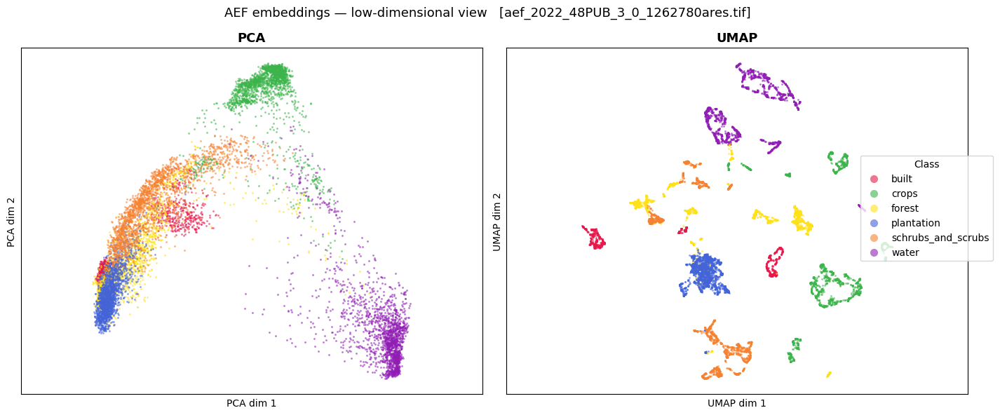

In [ ]:
GEOJSON_PATH = "data/alphaearth-workshop/annotations/alphaearth/workshop_annotations_original.geojson"
TILE_NAMES = [
    "aef_2022_48PUB_3_0_1262780ares.tif",
]

plot_low_dimensional_analysis(GEOJSON_PATH, TILE_NAMES)

# Support Vector Machines: High-dimensional hyperplane for classification

Mapping data to lower dimensions is a powerful tool for **visualisation and clustering** — but what if we could classify the embeddings directly in the original **64-dimensional space**, without any reduction?

## The Hyperplane

A **Support Vector Machine** (SVM) finds the hyperplane that separates two classes with the largest possible margin. For a sample $\mathbf{x} \in \mathbb{R}^{64}$, the decision boundary is:

$$\mathbf{w}^\top \mathbf{x} + b = 0, \qquad \mathbf{w} \in \mathbb{R}^{64}$$

The SVM selects $\mathbf{w}$ and $b$ by solving the following optimisation, which maximises the margin $\tfrac{2}{\|\mathbf{w}\|}$ between the two class boundaries:

$$\min_{\mathbf{w},\, b}\; \frac{1}{2}\|\mathbf{w}\|^2 \quad \text{subject to} \quad y_i\!\left(\mathbf{w}^\top \mathbf{x}_i + b\right) \geq 1 \;\; \forall\, i$$

A new sample is then classified by:

$$\hat{y} = \operatorname{sign}\!\left(\mathbf{w}^\top \mathbf{x} + b\right)$$

---

Hyperplanes assume that the data is **linearly separable** in the feature space. Complex real-world data, however, often lives on a **non-linear manifold** — meaning no single straight cut can cleanly separate all classes. What if we could learn the non-linearities in the data?

In [ ]:
GEOJSON_PATH = "data/alphaearth-workshop/annotations/alphaearth/workshop_annotations_original.geojson"
SVM_MODEL_PATH = "artifacts/svm_model.pkl"

svm_artifact = train_and_save_model(
    geojson_path=GEOJSON_PATH,
    model_out=SVM_MODEL_PATH,
    train_tiles=[
        "aef_2022_48QUD_2_4_1250519ares.tif",
        "aef_2022_48PVC_3_0_1287913ares.tif",
    ],
    test_tile="aef_2022_48PUB_3_0_1262780ares.tif",
)

svm_metrics = evaluate_svm_model(SVM_MODEL_PATH, geojson_path=GEOJSON_PATH)
print_svm_metrics(svm_metrics)

,Precision,Recall,F1,Support
Class,,,,
forest,0.766,0.928,0.839,"23,658"
not_forest,0.941,0.803,0.866,"33,893"


,Pred: forest,Pred: not_forest
True: forest,"21,952","1,706"
True: not_forest,"6,693","27,200"


In [ ]:
svm_outputs = build_svm_prediction_map_outputs(SVM_MODEL_PATH, geojson_path=GEOJSON_PATH)
svm_fig = build_svm_visualization_figure(SVM_MODEL_PATH, geojson_path=GEOJSON_PATH)


svm_fig.show()


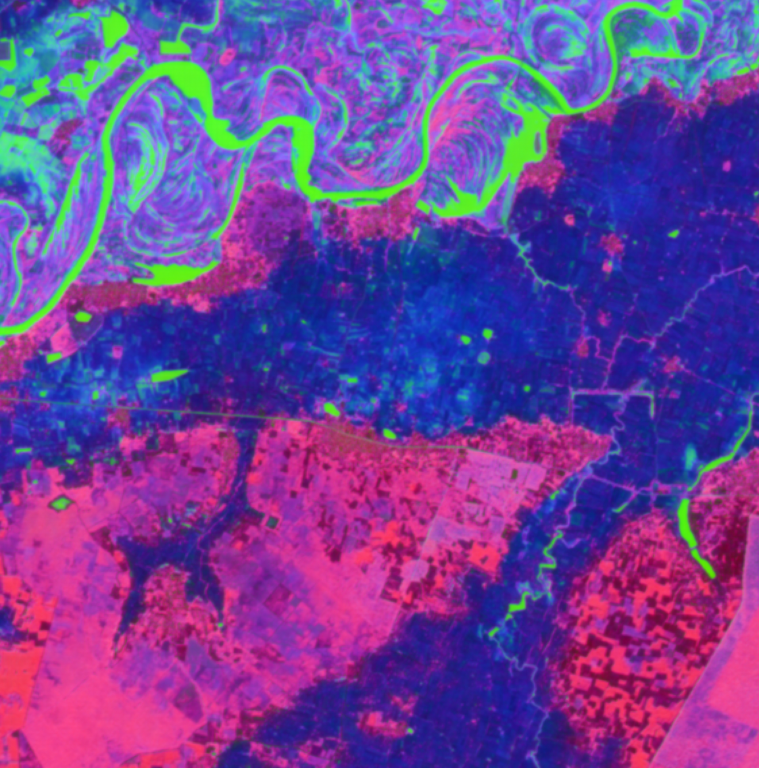
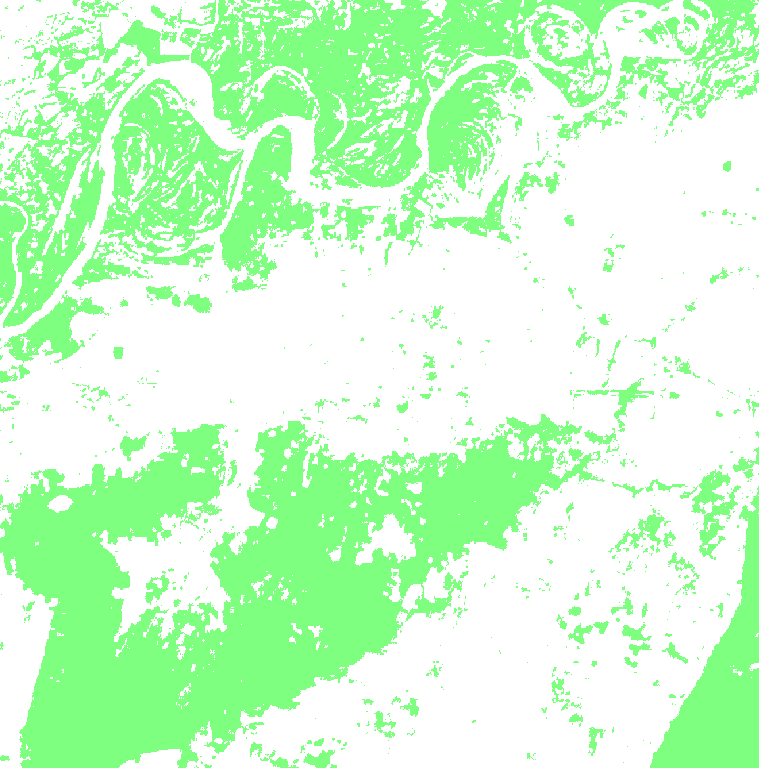

In [ ]:
svm_outputs["map"]

# Multi-layer Perceptron: Learning non-linearity

A **Multi-Layer Perceptron** (MLP) overcomes the linear limitation of SVMs by stacking layers of learned transformations, each followed by a non-linear activation function. For our architecture with hidden layers $(128,\, 64,\, 32)$, each layer $l$ computes:

$$\mathbf{h}^{(l)} = \operatorname{ReLU}\!\left(\mathbf{W}^{(l)}\,\mathbf{h}^{(l-1)} + \mathbf{b}^{(l)}\right), \qquad \operatorname{ReLU}(x) = \max(0,\, x)$$

The full network composes four transformations: $\mathbb{R}^{64} \to \mathbb{R}^{128} \to \mathbb{R}^{64} \to \mathbb{R}^{32} \to \mathbb{R}^2$. The ReLU activations introduce non-linearity at every layer, enabling the MLP to approximate arbitrarily complex decision boundaries — something a linear hyperplane fundamentally cannot do. The parameters $\mathbf{W}^{(l)},\, \mathbf{b}^{(l)}$ are optimised end-to-end via **backpropagation** using the Adam optimiser, with early stopping on validation forest F1.


In [ ]:
MLP_MODEL_PATH = "artifacts/mlp_model.pkl"

mlp_artifact = train_and_save_mlp(
    geojson_path=GEOJSON_PATH,
    model_out=MLP_MODEL_PATH,
    train_tile="aef_2022_48QUD_2_4_1250519ares.tif",
    val_tile="aef_2022_48PVC_3_0_1287913ares.tif",
    test_tile="aef_2022_48PUB_3_0_1262780ares.tif",
    max_epochs=50,
    patience=5,
)

mlp_metrics = evaluate_mlp_model(MLP_MODEL_PATH, geojson_path=GEOJSON_PATH)
print_mlp_metrics(mlp_metrics)

Starting MLP training | train_tile=aef_2022_48QUD_2_4_1250519ares.tif (162831 samples) | val_tile=aef_2022_48PVC_3_0_1287913ares.tif (91362 samples)


MLP epochs:   0%|          | 0/50 [00:00<?, ?epoch/s]

Early stopping at epoch 19: no validation forest F1 improvement in 5 epochs.
Best model selected from epoch 14 with validation forest F1=0.9571


,Pred: forest,Pred: not_forest
True: forest,"20,361","3,297"
True: not_forest,"3,800","30,093"



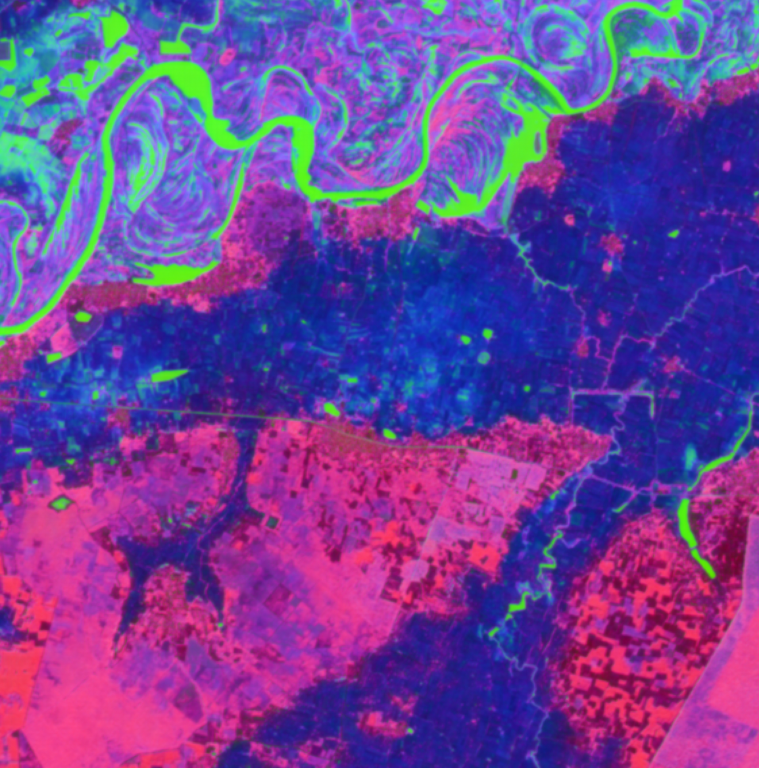
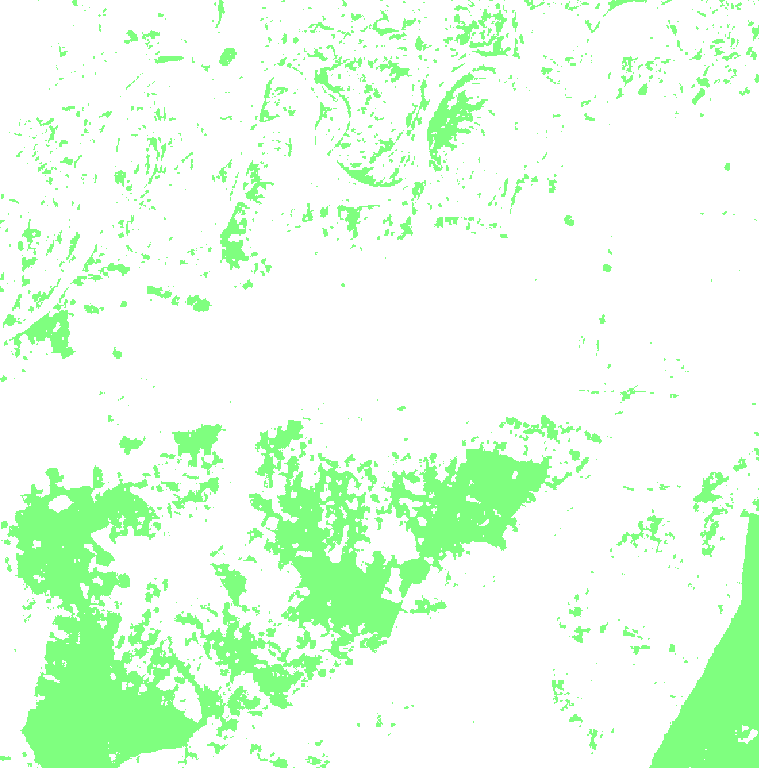

In [ ]:
mlp_outputs = build_mlp_visualization_outputs(MLP_MODEL_PATH, geojson_path=GEOJSON_PATH)
mlp_outputs["map"]


> Even though the MLP was able to learn non-linearities in the data, we only achieved **84% precision at 86% recall**. What could be the issue?

# Join Colab: https://bit.ly/4cfvFJi

# Challenge: Automate wrong-label detection

Our model performs well — but not perfectly. Part of the remaining error may not be the model's fault: **some annotation polygons in the test tile carry incorrect class labels**.

Your challenge is to design an algorithm that **automatically identifies likely mislabelled polygons** — without manually inspecting them one by one, and without hand-picking them by looking at the labels. As a bonus, extend your solution to **suggest the most probable correct label** for each flagged polygon.

- **The basemap shown in the visualisations does not correspond to the time period for which the labels were created** — visual inspection of current satellite imagery is not reliable ground truth

This is an open problem with no single correct solution.